###Import & Dataset + GDrive


---



In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Dataset: https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews

This dataset includes 23486 rows and 10 feature variables. Each row corresponds to a customer review, and includes the variables:

Clothing ID: Integer Categorical variable that refers to the specific piece being reviewed.

Age: Positive Integer variable of the reviewers age.

Title: String variable for the title of the review.

Review Text: String variable for the review body.

Rating: Positive Ordinal Integer variable for the product score granted by the customer from 1 Worst, to 5 Best.

Recommended IND: Binary variable stating where the customer recommends the product where 1 is recommended, 0 is not recommended.

Positive Feedback Count: Positive Integer documenting the number of other customers who found this review positive.

Division Name: Categorical name of the product high level division.
Department Name: Categorical name of the product department name.

Class Name: Categorical name of the product class name.

In [ ]:
!pip install plotly==5.1.0
!pip install cufflinks
!pip install textblob

In [ ]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
import plotly as py
import cufflinks as cf

In [ ]:
from plotly.offline import iplot

In [ ]:
py.offline.init_notebook_mode(connected=True)
cf.go_online()

# Data Import


---



In [ ]:
df = pd.read_csv("/content/gdrive/MyDrive/dev/Womens Clothing E-Commerce Reviews.csv")
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [ ]:
df.drop(labels=['Title','Clothing ID'], axis = 1, inplace=True)
df.head()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [ ]:
df.isnull().sum()

Unnamed: 0                   0
Age                          0
Review Text                845
Rating                       0
Recommended IND              0
Positive Feedback Count      0
Division Name               14
Department Name             14
Class Name                  14
dtype: int64

In [ ]:
df.dropna(subset=['Review Text', 'Division Name'], inplace = True)

In [ ]:
df.isnull().sum()

Unnamed: 0                 0
Age                        0
Review Text                0
Rating                     0
Recommended IND            0
Positive Feedback Count    0
Division Name              0
Department Name            0
Class Name                 0
dtype: int64

In [ ]:
' '.join(df['Review Text'].tolist())

'Absolutely wonderful - silky and sexy and comfortable Love this dress!  it\'s sooo pretty.  i happened to find it in a store, and i\'m glad i did bc i never would have ordered it online bc it\'s petite.  i bought a petite and am 5\'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite. I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c I love, love, love this jumpsuit. it\'s fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments! This shirt

# Text Cleaning:

---



In [ ]:
contractions =  {
"'aight": "alright",
"ain't": "is not",
"amn't": "am not",
"aren't": "are not",
"can't": "cannot",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"daren't": "dare not",
"daresn't": "dare not",
"dasn't": "dare not",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"dunno": "do not know",
"d'ye": "do you",
"e'er": "ever",
"everybody's": "everybody is",
"everyone's": "everyone is",
"finna": "fixing",
"g'day": "good day",
"gimme": "give me",
"giv'n": "given",
"gonna": "going to",
"gon't": "go not",
"gotta": "got to",
"hadn't": "had not",
"had've": "had have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had",
"he'll": "he will",
"he's": "he is",
"he've": "he have",
"how'd": "how did",
"howdy": "how do you do",
"how'll": "how will",
"how're": "how are",
"how's": "how is",
"I'd": "I would ",
"I'd've": "I would have",
"I'll": "I will",
"I'm": "I am",
"I'm'a": "I am about to",
"I'm'o": "I am going to",
"innit": "is it not",
"I've": "I have",
"isn't": "is not",
"it'd": "it would",
"it'll": "it will",
"it's": "it is",
"iunno": "I do not know",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"may've": "may have",
"methinks": "me thinks",
"mightn't": "might not",
"might've": "might have",
"mustn't": "must not",
"mustn't've": "must not have",
"must've": "must have",
"needn't": "need not",
"ne'er": "never",
"o'clock": "of the clock",
"o'er": "over",
"ol'": "old",
"oughtn't": "ought not",
"'s": "is",
"shalln't": "shall not",
"shan't": "shall not",
"she'd": "she had",
"she'll": "she shall",
"she's": "she has",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"somebody's": "somebody is",
"someone's": "someone is",
"something's": "something is",
"so're": "so are",
"that'll": "that will",
"that're": "that are",
"that's": "that is",
"that'd": "that would",
"there'd": "there would",
"there'll": "there will",
"there're": "there are",
"there's": "there is",
"these're": "these are",
"these've": "these have",
"they'd": "they would",
"they'll": "they will",
"they're": "they are",
"they've": "they have",
"this's": "this is",
"those're": "those are",
"those've": "those have",
"'tis": "it is",
"to've": "to have",
"'twas": "it was",
"wanna": "want to",
"wasn't": "was not",
"we'd": "we would",
"we'd've": "we would have",
"we'll": "we will",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'd": "what did",
"what'll": "what will",
"what're": "what are",
"what's": "what is",
"what've": "what have",
"when's": "when is",
"where'd": "where did",
"where'll": "where will",
"where're": "where are",
"where's": "where is",
"where've": "where have",
"which'd": "which would",
"which'll": "which will",
"which're": "which are",
"which's": "which is",
"which've": "which have",
"who'd": "who would",
"who'd've": "who would have",
"who'll": "who will",
"who're": "who are",
"who's": "who is",
"who've": "who have",
"why'd": "why did",
"why're": "why are",
"why's": "why is",
"willn't": "will not ",
"won't": "will not",
"wonnot": "will not ",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all ",
"y'all'd've": "you all would have ",
"y'all're": "you all are ",
"you'd": "you would",
"you'll": "you will",
"you're": "you are",
"you've": "you have"
  }

In [ ]:
def cont_to_exp(x):
  if type(x) is str:
      x = x.replace('\\', '')
      for key in contractions:
        value = contractions[key]
        x = x.replace(key, value)
      return x
  else:
      return x

In [ ]:
x = "i don't know what date is today, I am 5'8\""

In [ ]:
print(cont_to_exp(x))

i do not know what date is today, I am 5'8"


In [ ]:
%%time
df['Review Text'] = df['Review Text'].apply(lambda x: cont_to_exp(x))

CPU times: user 2.37 s, sys: 4.99 ms, total: 2.38 s
Wall time: 2.68 s


In [ ]:
df.head()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,34,Love this dress! it is sooo pretty. i happen...,5,1,4,General,Dresses,Dresses
2,2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,50,"I love, love, love this jumpsuit. it is fun, f...",5,1,0,General Petite,Bottoms,Pants
4,4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [ ]:
print(' '.join(df['Review Text'].tolist())[:1000])

Absolutely wonderful - silky and sexy and comfortable Love this dress!  it is sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it is petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite. I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c I love, love, love this jumpsuit. it is fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments! This shirt is

# Feature Engeniering


---




In [ ]:
df.head()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,34,Love this dress! it is sooo pretty. i happen...,5,1,4,General,Dresses,Dresses
2,2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,50,"I love, love, love this jumpsuit. it is fun, f...",5,1,0,General Petite,Bottoms,Pants
4,4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [ ]:
from textblob import TextBlob

In [ ]:
df['polarity'] = df['Review Text'].apply(lambda x: TextBlob(x).sentiment.polarity)

In [ ]:
df['review_len'] = df['Review Text'].apply(lambda x: len(x))

In [ ]:
df['word_count'] = df['Review Text'].apply(lambda x: len(x.split()))

In [ ]:
def get_avg_word_len(x):
  words = x.split()
  word_len = 0 
  for word in words:
    word_len = word_len + len(word)

  return word_len/len(words)

In [ ]:
df['avg_word_len'] = df['Review Text'].apply(lambda x: get_avg_word_len(x))

In [ ]:
df.head()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity,review_len,word_count,avg_word_len
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333,53,8,5.750000
1,1,34,Love this dress! it is sooo pretty. i happen...,5,1,4,General,Dresses,Dresses,0.339583,305,64,3.703125
2,2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,0.073675,500,98,4.112245
3,3,50,"I love, love, love this jumpsuit. it is fun, f...",5,1,0,General Petite,Bottoms,Pants,0.550000,125,23,4.478261
4,4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,0.512891,192,36,4.361111


# Distribution of Sentiment Polarity


---



In [ ]:
df.head()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity,review_len,word_count,avg_word_len
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333,53,8,5.750000
1,1,34,Love this dress! it is sooo pretty. i happen...,5,1,4,General,Dresses,Dresses,0.339583,305,64,3.703125
2,2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,0.073675,500,98,4.112245
3,3,50,"I love, love, love this jumpsuit. it is fun, f...",5,1,0,General Petite,Bottoms,Pants,0.550000,125,23,4.478261
4,4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,0.512891,192,36,4.361111


In [ ]:
# df.iplot()

In [ ]:
#!pip install chart_studio

In [ ]:
#import chart_studio.plotly as py
#import plotly.graph_objs as go

In [ ]:
#import plotly.express as py

In [ ]:
#import pandas as pd
#pd.options.plotting.backend = "plotly"

There's no need to use iplot anymore. Just set the pandas plotting backend to plotly with pd.options.plotting.backend = "plotly"and use df.plot().

Here's a setup using your example:

import pandas as pd
pd.options.plotting.backend = "plotly"

df1=pd.DataFrame(np.random.randn(10,3),columns=['A','B','C'])
df1.plot()
enter image description here


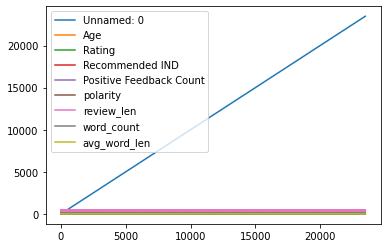

In [ ]:
df.plot()

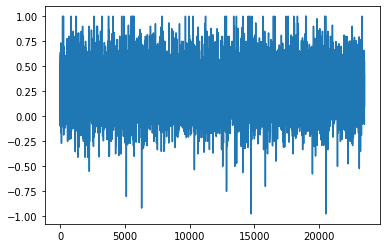

In [ ]:
df['polarity'].plot()

xTitle = xlabel

yTitle = ylabel


# Distribution of eviews Rating and Reviewers Age

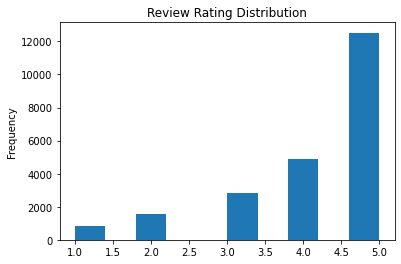

In [ ]:
df['Rating'].plot(kind = 'hist', xlabel='Rating', ylabel= 'Count', title='Review Rating Distribution')

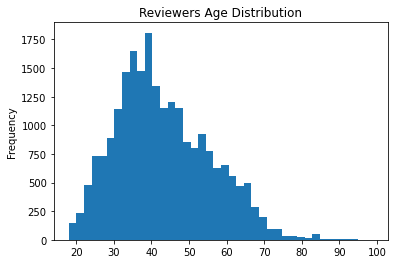

In [ ]:
df['Age'].plot( kind = 'hist', bins=40, xlabel='Age', ylabel='Count', title='Reviewers Age Distribution')

# Review Text Length


---



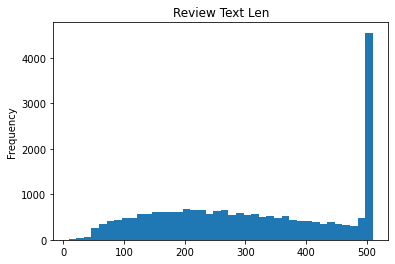

In [ ]:
df['review_len'].plot(kind='hist', bins=40, xlabel='Review Len', ylabel='Count', title='Review Text Len' )

# Word Count Distribution


---



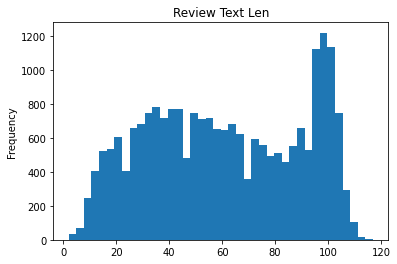

In [ ]:
df['word_count'].plot(kind='hist', bins=40,  xlabel='Review Len', ylabel='Count', title='Review Text Len' )

# AVG Word Len Distribution

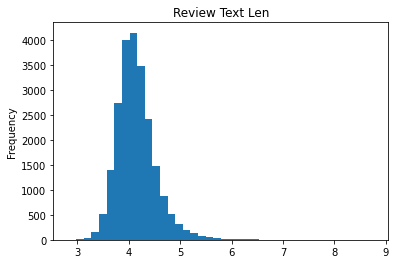

In [ ]:
df['avg_word_len'].plot(kind='hist', bins=40, x='avg_word_len', y='Count', title='Review Text Len' )


# Distribution of Department, Division and Class


---



In [ ]:
df.head(1)

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity,review_len,word_count,avg_word_len
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333,53,8,5.75


In [ ]:
df['Department Name'].value_counts()

Tops        10048
Dresses      6145
Bottoms      3662
Intimate     1653
Jackets      1002
Trend         118
Name: Department Name, dtype: int64

In [ ]:
df.groupby('Department Name').count()

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Class Name,polarity,review_len,word_count,avg_word_len
Department Name,,,,,,,,,,,,
Bottoms,3662,3662,3662,3662,3662,3662,3662,3662,3662,3662,3662,3662
Dresses,6145,6145,6145,6145,6145,6145,6145,6145,6145,6145,6145,6145
Intimate,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653,1653
Jackets,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002
Tops,10048,10048,10048,10048,10048,10048,10048,10048,10048,10048,10048,10048
Trend,118,118,118,118,118,118,118,118,118,118,118,118


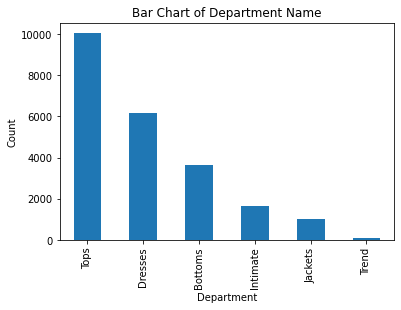

In [ ]:
df['Department Name'].value_counts().plot(kind = 'bar', ylabel='Count', xlabel='Department', title='Bar Chart of Department Name')

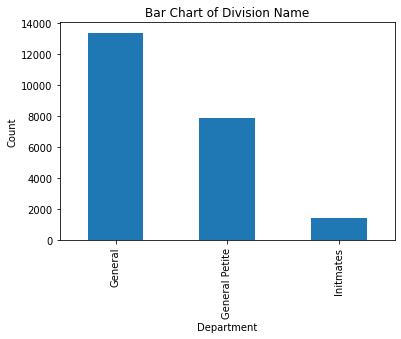

In [ ]:
df['Division Name'].value_counts().plot(kind = 'bar', ylabel='Count', xlabel='Department', title='Bar Chart of Division Name')

# Distribution of unigram, bigram & Trigram

###Unigram


---



---



In [ ]:
x = 'This is a test example'

# unigram = this, is, a, test, example
# bigram = this is, a test, example
# trigram = this is a,a  test example

In [ ]:
x=['this is the list list this ']

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
vec = CountVectorizer().fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this', 2), ('list', 2)]

In [ ]:
sum_words

matrix([[1, 2, 1, 2]], dtype=int64)

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer().fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
get_top_n_words(x, 3)

[('this', 2), ('list', 2), ('is', 1)]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)


In [ ]:
words


[('the', 76159),
 ('it', 49162),
 ('and', 48993),
 ('is', 37447),
 ('this', 25758),
 ('to', 24592),
 ('in', 20722),
 ('not', 17021),
 ('but', 16549),
 ('on', 15325),
 ('for', 13994),
 ('of', 13428),
 ('was', 12923),
 ('with', 12797),
 ('so', 12017),
 ('my', 11027),
 ('dress', 10561),
 ('that', 9560),
 ('love', 8945),
 ('size', 8770)]

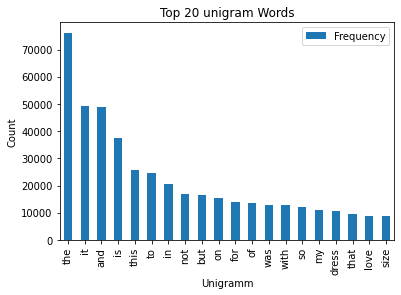

In [ ]:
df1 = pd.DataFrame(words, columns =['Unigram', 'Frequency'])
df1 = df1.set_index('Unigram')
df1.plot(kind = 'bar', xlabel='Unigramm', ylabel='Count', title='Top 20 unigram Words')

###Bigramm


---



---



In [ ]:
vec = CountVectorizer(ngram_range = (2, 2)).fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this is', 1), ('is the', 1)]

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer(ngram_range = (2, 2)).fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
get_top_n_words(x, 3)

[('this is', 1), ('is the', 1), ('the list', 1)]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)
words

[('it is', 12528),
 ('in the', 7169),
 ('and the', 5613),
 ('this dress', 4755),
 ('on the', 4337),
 ('of the', 3933),
 ('and it', 3725),
 ('it was', 3287),
 ('this top', 2937),
 ('this is', 2772),
 ('is very', 2724),
 ('the fabric', 2653),
 ('love the', 2641),
 ('did not', 2487),
 ('love this', 2331),
 ('to wear', 2266),
 ('but it', 2196),
 ('the dress', 2178),
 ('do not', 2117),
 ('is not', 2096)]

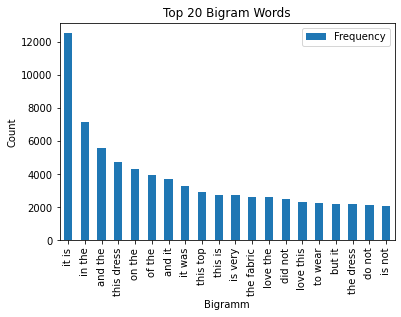

In [ ]:
df1 = pd.DataFrame(words, columns =['Bigramm', 'Frequency'])
df1 = df1.set_index('Bigramm')
df1.plot(kind = 'bar', xlabel='Bigramm', ylabel='Count', title='Top 20 Bigram Words')

###Trigram


---



---



In [ ]:
vec = CountVectorizer(ngram_range = (3, 3)).fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this is the', 1), ('is the list', 1)]

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer(ngram_range = (3, 3)).fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
get_top_n_words(x, 3)

[('this is the', 1), ('is the list', 1), ('the list list', 1)]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)
words

[('true to size', 1316),
 ('the fabric is', 1301),
 ('and it is', 1126),
 ('this dress is', 1123),
 ('it is very', 976),
 ('but it is', 921),
 ('it is not', 910),
 ('the material is', 896),
 ('if you are', 733),
 ('in the store', 728),
 ('on the model', 722),
 ('the fit is', 696),
 ('this top is', 672),
 ('the color is', 630),
 ('love this dress', 603),
 ('it is so', 585),
 ('tried it on', 574),
 ('and it was', 550),
 ('in the back', 528),
 ('the dress is', 518)]

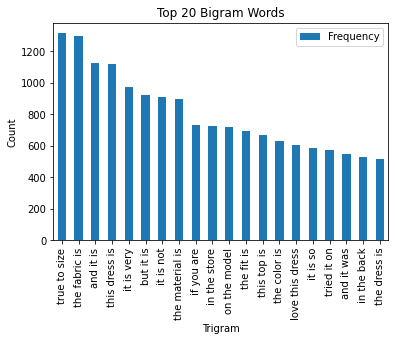

In [ ]:
df1 = pd.DataFrame(words, columns =['Trigram', 'Frequency'])
df1 = df1.set_index('Trigram')
df1.plot(kind = 'bar', xlabel='Trigram', ylabel='Count', title='Top 20 Bigram Words')

# Distribution of Unigram, Bigram and Trigram without STOP WORDS


---



## Unigram


In [ ]:
vec = CountVectorizer(ngram_range = (1, 1)).fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this', 2), ('list', 2)]

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer(ngram_range = (1, 1),stop_words='english').fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
get_top_n_words(x, 3)

[('list', 2)]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)
words

[('dress', 10561),
 ('love', 8945),
 ('size', 8770),
 ('fit', 7322),
 ('like', 7148),
 ('wear', 6434),
 ('great', 6114),
 ('just', 5604),
 ('fabric', 4792),
 ('small', 4725),
 ('color', 4604),
 ('look', 4039),
 ('really', 3924),
 ('ordered', 3850),
 ('little', 3773),
 ('perfect', 3772),
 ('flattering', 3519),
 ('did', 3448),
 ('soft', 3335),
 ('comfortable', 3058)]

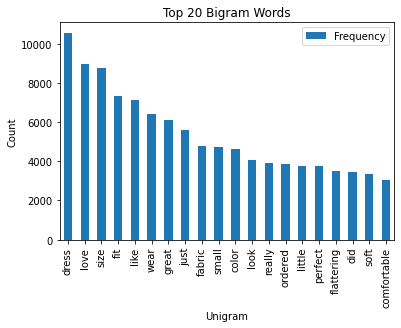

In [ ]:
df1 = pd.DataFrame(words, columns =['Unigram', 'Frequency'])
df1 = df1.set_index('Unigram')
df1.plot(kind = 'bar', xlabel='Unigram', ylabel='Count', title='Top 20 Bigram Words')

## bigramm

---



In [ ]:
vec = CountVectorizer(ngram_range = (2, 2)).fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this is', 1), ('is the', 1)]

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer(ngram_range = (2, 2),stop_words='english').fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
get_top_n_words(x, 3)

[('list list', 1)]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)
words

[('true size', 1347),
 ('love dress', 764),
 ('usually wear', 694),
 ('looks great', 620),
 ('fit perfectly', 609),
 ('size small', 540),
 ('fits perfectly', 489),
 ('usual size', 479),
 ('just right', 434),
 ('look like', 426),
 ('ordered size', 375),
 ('love love', 374),
 ('looks like', 373),
 ('runs large', 367),
 ('super cute', 363),
 ('highly recommend', 363),
 ('wear size', 361),
 ('fabric soft', 353),
 ('feel like', 349),
 ('fit great', 348)]

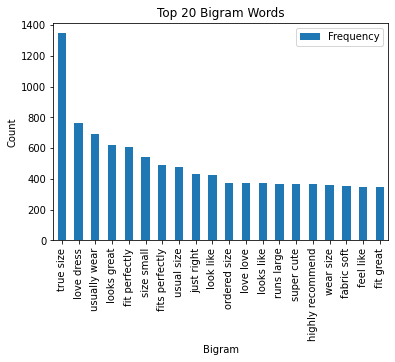

In [ ]:
df1 = pd.DataFrame(words, columns =['Bigram', 'Frequency'])
df1 = df1.set_index('Bigram')
df1.plot(kind = 'bar', xlabel='Bigram', ylabel='Count', title='Top 20 Bigram Words')

## trigramm 


In [ ]:
vec = CountVectorizer(ngram_range = (3, 3)).fit(x)
bow = vec.transform(x)
sum_words = bow.sum(axis=0)
vec.vocabulary_.items()
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
words_freq[:2]

[('this is the', 1), ('is the list', 1)]

In [ ]:
def get_top_n_words(x, n):
  vec = CountVectorizer(ngram_range = (3, 3),stop_words='english').fit(x)
  bow = vec.transform(x)
  sum_words = bow.sum(axis=0)
  vec.vocabulary_.items()
  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key= lambda x: x[1],reverse=True)
  return words_freq[:n]

In [ ]:
words = get_top_n_words(df['Review Text'], 20)
words

[('fits true size', 280),
 ('fit true size', 229),
 ('runs true size', 148),
 ('love love love', 143),
 ('usually wear size', 136),
 ('ordered usual size', 107),
 ('does run large', 96),
 ('really wanted love', 94),
 ('wanted love dress', 88),
 ('usually wear small', 80),
 ('small fit perfectly', 77),
 ('just did work', 71),
 ('looks great jeans', 70),
 ('fit like glove', 69),
 ('usually wear medium', 68),
 ('normally wear size', 68),
 ('small fits perfectly', 65),
 ('size fit perfectly', 65),
 ('fits like glove', 65),
 ('usual size small', 64)]

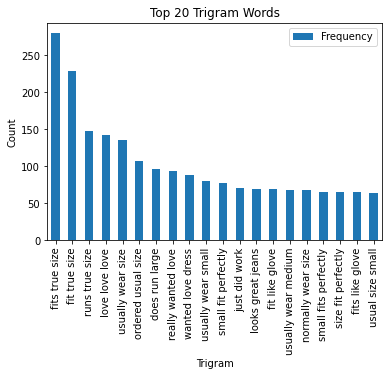

In [ ]:
df1 = pd.DataFrame(words, columns =['Trigram', 'Frequency'])
df1 = df1.set_index('Trigram')
df1.plot(kind = 'bar', xlabel='Trigram', ylabel='Count', title='Top 20 Trigram Words')

# Distribution of Top 20 Parts-ofSpeech POS tags


---






In [ ]:
!pip install nltk

In [ ]:
import nltk 

In [ ]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
#print(nltk.help.upenn_tagset())

In [ ]:
  >>> import nltk
  >>> nltk.download('tagsets')

[nltk_data] Downloading package tagsets to /root/nltk_data...
[nltk_data]   Unzipping help/tagsets.zip.


True

In [ ]:
print(nltk.help.upenn_tagset())

$: dollar
    $ -$ --$ A$ C$ HK$ M$ NZ$ S$ U.S.$ US$
'': closing quotation mark
    ' ''
(: opening parenthesis
    ( [ {
): closing parenthesis
    ) ] }
,: comma
    ,
--: dash
    --
.: sentence terminator
    . ! ?
:: colon or ellipsis
    : ; ...
CC: conjunction, coordinating
    & 'n and both but either et for less minus neither nor or plus so
    therefore times v. versus vs. whether yet
CD: numeral, cardinal
    mid-1890 nine-thirty forty-two one-tenth ten million 0.5 one forty-
    seven 1987 twenty '79 zero two 78-degrees eighty-four IX '60s .025
    fifteen 271,124 dozen quintillion DM2,000 ...
DT: determiner
    all an another any both del each either every half la many much nary
    neither no some such that the them these this those
EX: existential there
    there
FW: foreign word
    gemeinschaft hund ich jeux habeas Haementeria Herr K'ang-si vous
    lutihaw alai je jour objets salutaris fille quibusdam pas trop Monte
    terram fiche oui corporis ...
IN: preposition or

In [ ]:
blob = TextBlob(str(df['Review Text']))
blob.tags

[('0', 'CD'),
 ('Absolutely', 'RB'),
 ('wonderful', 'JJ'),
 ('silky', 'NN'),
 ('and', 'CC'),
 ('sexy', 'NN'),
 ('and', 'CC'),
 ('comf', 'NN'),
 ('1', 'CD'),
 ('Love', 'NNP'),
 ('this', 'DT'),
 ('dress', 'NN'),
 ('it', 'PRP'),
 ('is', 'VBZ'),
 ('sooo', 'JJ'),
 ('pretty', 'RB'),
 ('i', 'NN'),
 ('happen', 'VBP'),
 ('2', 'CD'),
 ('I', 'PRP'),
 ('had', 'VBD'),
 ('such', 'JJ'),
 ('high', 'JJ'),
 ('hopes', 'NNS'),
 ('for', 'IN'),
 ('this', 'DT'),
 ('dress', 'NN'),
 ('and', 'CC'),
 ('reall', 'NN'),
 ('3', 'CD'),
 ('I', 'PRP'),
 ('love', 'VBP'),
 ('love', 'VBP'),
 ('love', 'VBP'),
 ('this', 'DT'),
 ('jumpsuit', 'NN'),
 ('it', 'PRP'),
 ('is', 'VBZ'),
 ('fun', 'JJ'),
 ('f', 'JJ'),
 ('4', 'CD'),
 ('This', 'DT'),
 ('shirt', 'NN'),
 ('is', 'VBZ'),
 ('very', 'RB'),
 ('flattering', 'JJ'),
 ('to', 'TO'),
 ('all', 'DT'),
 ('due', 'JJ'),
 ('to', 'TO'),
 ('th', 'VB'),
 ('23481', 'CD'),
 ('I', 'PRP'),
 ('was', 'VBD'),
 ('very', 'RB'),
 ('happy', 'JJ'),
 ('to', 'TO'),
 ('snag', 'VB'),
 ('this', 'DT'),
 ('dr

In [ ]:
pos_df = pd.DataFrame(blob.tags, columns = ['words', 'pos'])
pos_df = pos_df['pos'].value_counts()
pos_df

NN     23
DT     15
JJ     13
CD     11
PRP     8
RB      6
VBP     5
IN      5
VBZ     5
VBD     4
CC      4
NNP     4
TO      3
NNS     2
VB      2
PDT     1
Name: pos, dtype: int64

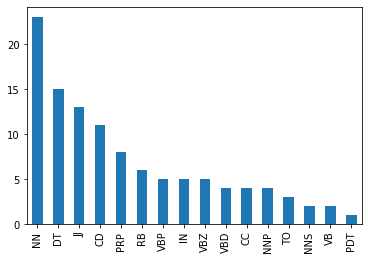

In [ ]:
pos_df.plot(kind='bar')

# Bivariate Analysis:


---



## Distribution of Sentiment Polarity of reviews Based on the Recommendations


In [ ]:
df.head(2)

,Unnamed: 0,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity,review_len,word_count,avg_word_len
0,0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333,53,8,5.750000
1,1,34,Love this dress! it is sooo pretty. i happen...,5,1,4,General,Dresses,Dresses,0.339583,305,64,3.703125


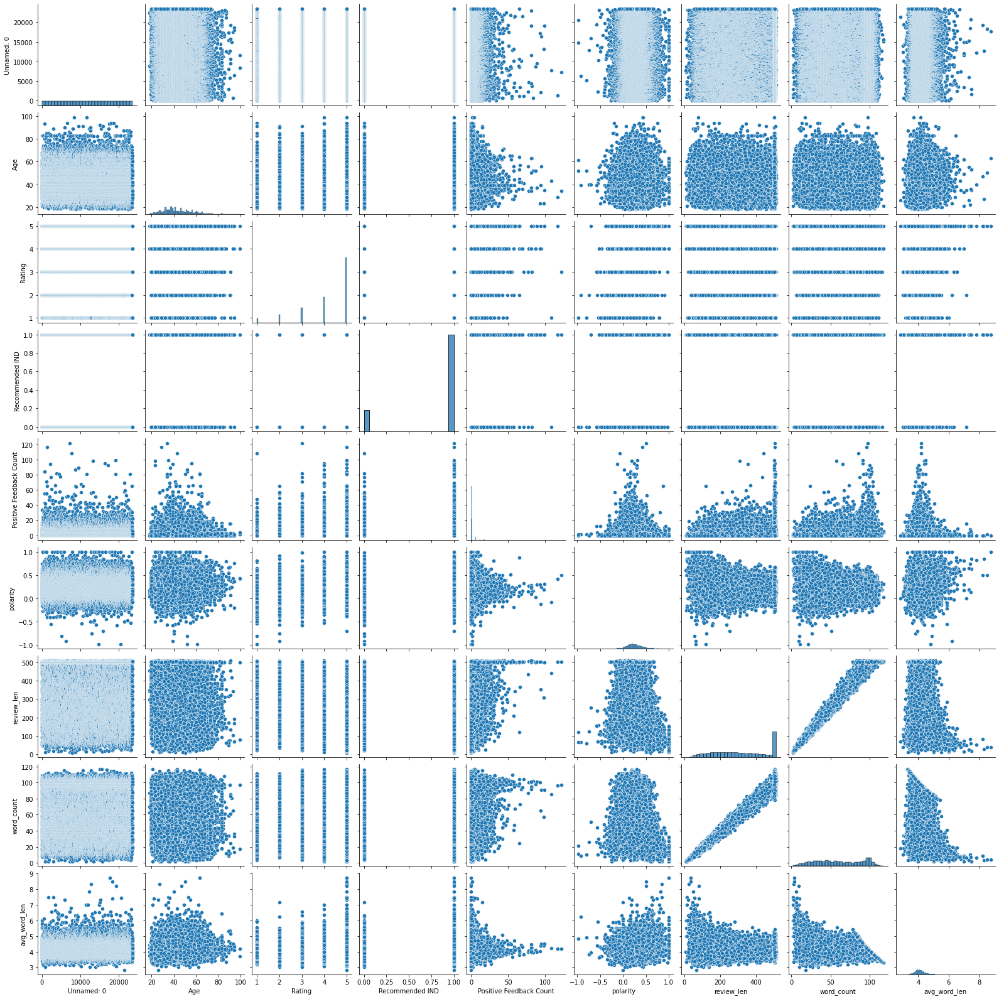

In [ ]:
sns.pairplot(df)

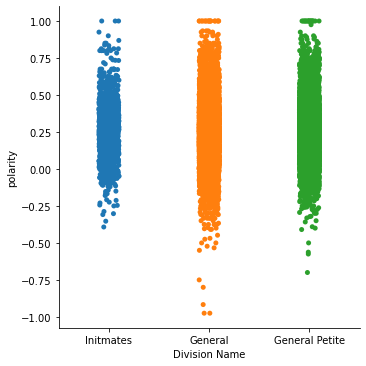

In [ ]:
sns.catplot(x = 'Division Name', y = 'polarity', data = df)

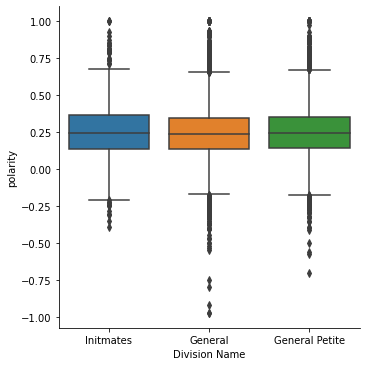

In [ ]:
sns.catplot(x = 'Division Name', y = 'polarity', data = df, kind= 'box')

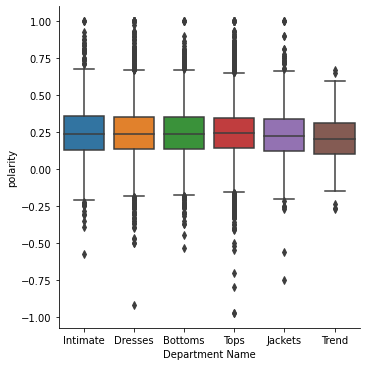

In [ ]:
sns.catplot(x = 'Department Name', y = 'polarity', data = df, kind= 'box')

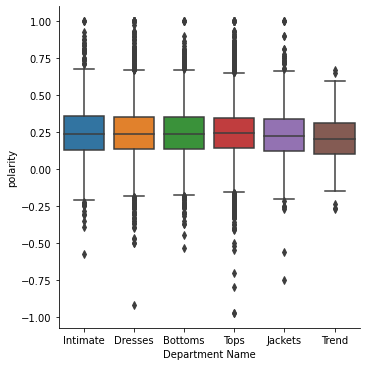

In [ ]:
sns.catplot(x = 'Department Name', y = 'polarity', data = df, kind= 'box')

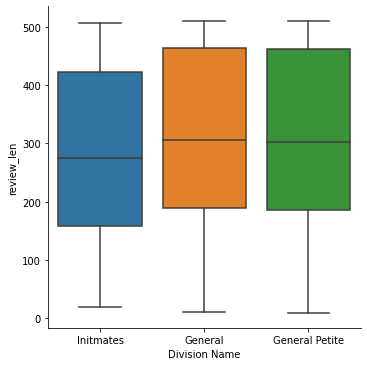

In [ ]:
sns.catplot(x = 'Division Name', y = 'review_len', data = df, kind ='box')

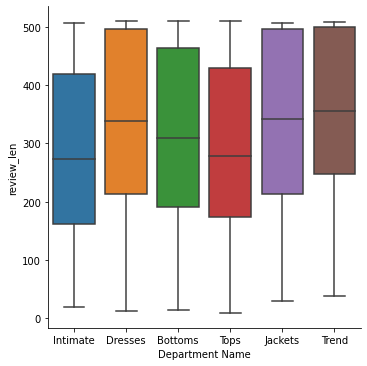

In [ ]:
sns.catplot(x = 'Department Name', y = 'review_len', data = df, kind ='box')

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
pip install plotly

In [ ]:
pip install plotly==5.1.0

In [ ]:
x1 = df[df['Recommended IND']==1]['polarity']
x0 = df[df['Recommended IND']==0]['polarity']

In [ ]:
type(x1)

pandas.core.series.Series

In [ ]:
trace0 = go.Histogram(x= x0, name='Not Recommended', opacity=0.7)
trace1 = go.Histogram(x= x1, name='Recommended', opacity=0.8)

In [ ]:
from plotly.offline import iplot, init_notebook_mode
from plotly.subplots import make_subplots
init_notebook_mode()
import plotly.graph_objs as go



In [ ]:
#type(fig)

In [ ]:
# test graph for Colab:
# Make ploty work in google.colab
import plotly
#without this line of code the graphs are not displayed in colab.research.google.com
plotly.io.renderers.default = 'colab'

# proof of Concept:  
# example Plot
import plotly.graph_objects as go
fig = go.Figure( go.Scatter(x=[1,2,3], y=[1,3,2] ) )
fig.show()

In [ ]:
data = [ trace0, trace1]
layout = go.Layout(barmode='overlay', title='Distribution of sentiment polarity of Revies based on the Recommendation')
fig = go.Figure(data = data, layout = layout)
print(fig)
fig.show()

# not Working in colab -->  see above
  #fig.plot(fig)
  #iplot(fig)
  #plot(fig, auto_open=False)
  # fig.show   
  # iplot(fig) 

Figure({
    'data': [{'name': 'Not Recommended',
              'opacity': 0.7,
              'type': 'histogram',
              'x': array([ 0.07367495,  0.17875   , -0.09714947, ...,  0.10037037, -0.07878788,
                           0.41428571])},
             {'name': 'Recommended',
              'opacity': 0.8,
              'type': 'histogram',
              'x': array([0.63333333, 0.33958333, 0.55      , ..., 0.09166667, 0.15555556,
                          0.41388889])}],
    'layout': {'barmode': 'overlay',
               'template': '...',
               'title': {'text': 'Distribution of sentiment polarity of Revies based on the Recommendation'}}
})


## Distribustion of ratings Based on Recommendation

In [ ]:
x1 = df[df['Recommended IND']==1]['Rating']
x0 = df[df['Recommended IND']==0]['Rating']

In [ ]:
type(x1)

pandas.core.series.Series

In [ ]:
trace0 = go.Histogram(x= x0, name='Not Recommended', opacity=0.7)
trace1 = go.Histogram(x= x1, name='Recommended', opacity=0.8)

In [ ]:
from plotly.offline import iplot, init_notebook_mode
from plotly.subplots import make_subplots
init_notebook_mode()
import plotly.graph_objs as go



In [ ]:
type(fig)

plotly.graph_objs._figure.Figure

In [ ]:
import plotly
#without this line of code the graphs are not displayed in colab.research.google.com
plotly.io.renderers.default = 'colab'
# example
import plotly.graph_objects as go


In [ ]:
data = [ trace0, trace1]
layout = go.Layout(barmode='overlay', title='Distribution of Ratings polarity of Revies based on the Recommendation')
fig = go.Figure(data = data, layout = layout)
print(fig)
fig.show()
#fig.plot(fig)
#iplot(fig)

#plot(fig, auto_open=False)

Figure({
    'data': [{'name': 'Not Recommended', 'opacity': 0.7, 'type': 'histogram', 'x': array([3, 2, 3, ..., 3, 1, 3])},
             {'name': 'Recommended', 'opacity': 0.8, 'type': 'histogram', 'x': array([4, 5, 5, ..., 3, 3, 5])}],
    'layout': {'barmode': 'overlay',
               'template': '...',
               'title': {'text': 'Distribution of Ratings polarity of Revies based on the Recommendation'}}
})


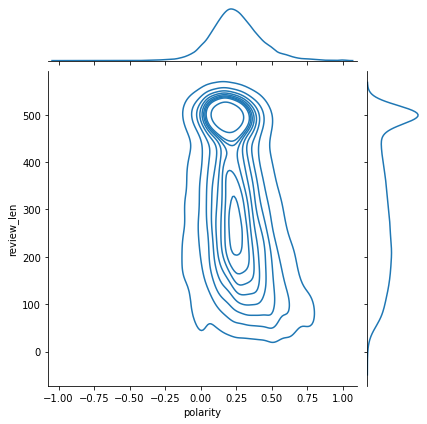

In [ ]:
sns.jointplot(x ='polarity', y= 'review_len',data=df, kind='kde')

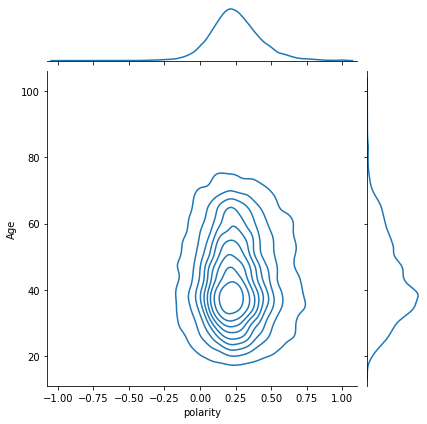

In [ ]:
sns.jointplot(x ='polarity', y= 'Age',data=df, kind='kde')